This notebook contains the coding exercise as provided by ArbiLex. 
- Part 1 of this exercise consists of scraping the United States District Court for the District of Delaware.
- Part 2 of this exercise consists of some exploratory analysis based on the data you extracted from Part 1.

Metadata:
- Author: Daniel Bejarano
- Date: Apr 16, 2023
- License: None
    



# Setup

In [1]:
# Crawling
import requests
from bs4 import BeautifulSoup
import io

# Text Extraction
from PyPDF2 import PdfReader
import requests
from pdf2image import convert_from_path  # brew install poppler
import pytesseract
import tempfile
from pathlib import Path

# General
from datetime import datetime
import pandas as pd
import json

# Settings
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 100000)

# Text Analysis
import nltk
from nltk.stem import WordNetLemmatizer
import numpy as np
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from gensim.models.ldamulticore import LdaMulticore
import gensim
from gensim import corpora, models
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import unicodedata
from sentence_transformers import SentenceTransformer

# Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Visuals
import matplotlib.pyplot as plt
import plotly.express as px
import umap
import wordcloud
from wordcloud import WordCloud

/Users/danielbejarano/opt/miniconda3/envs/arbilex_case/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# PART I

## Scrape Site

In [2]:
# Specify start and end dates
start_date = datetime.strptime('2022-01-01', '%Y-%m-%d') 
end_date = datetime.strptime('2023-01-01', '%Y-%m-%d') 

# Initialize data containers
pdf_dates = [start_date, end_date]  # Initiate with start and end dates so we can compare at iteration 0
all_data = []

# Run custom crawler
counter = 0
while (min(pdf_dates) >= start_date or max(pdf_dates) <= end_date):
    
    print(f"Reading Page {counter}")
        
    # To avoid an infinite loop
    if counter > 50:
        break
        
    # Select URL
    if counter == 0:
        url = 'https://www.ded.uscourts.gov/judges-info/opinions/'
    else:
        url = f'https://www.ded.uscourts.gov/judges-info/opinions?page={counter}'
        
    # Extract HTML
    read = requests.get(url)
    html = read.content
    soup = BeautifulSoup(html, "html.parser")

    # ------------------
    # Extract Meta Data
    # ------------------

    # Date
    date_spans = soup.find_all('span', {'class': 'date-display-single'})
    
    # Iterate through date tables 
    for ds in date_spans:
        
        # Extract date span and add date to container
        date_table = ds.parent.parent
        date = ds['content'][:10]
        dt = datetime.strptime(date, '%Y-%m-%d')
        pdf_dates.append(dt)

        # PDF Links
        pdf_a = date_table.find_all("a", {'type': lambda x: x and 'application/pdf' in x})
        pdf_links = [a["href"] for a in pdf_a]

        # Title
        title_a = date_table.select('td.views-field-title > a')
        case_names = [t.text for t in title_a]

        # Case Numbers
        case_a = date_table.find_all("td", {'class': 'views-field-field-case'})
        case_numbers = [t.text.strip() for t in case_a]

        # Case Names
        judge_a = date_table.select('td.views-field-field-judge > a')
        judge_names = [t.text for t in judge_a]

        # Combine data in a list of dictionaries for JSON storage
        # Note: PDF contents are extracted at a later step, to minimize risk of having to re-scrape (and blockage)
        extracted_data = []
        for link, c_name, c_num, judge in zip(pdf_links, case_names, case_numbers, judge_names):
            ds_data = {
                'case_name': c_name,
                'case_number': c_num,
                'judge': judge,
                'date': f'{date[5:7]}-{date[8:10]}-{date[:4]}',
                'pdf_link': link,
                'ocr_text': '' 
            }
            all_data.append(ds_data)        
    
    # Visual Checks
    if counter == 0:
        print(f'\nDATE: {date} \n')
        print(f'{len(pdf_links)} PDF Links')
        print(pdf_links, '\n')
        print(f'{len(case_names)} Case Names')
        print(case_names, '\n')
        print(f'{len(case_numbers)} Case Numbers')
        print(case_numbers, '\n')
        print(f'{len(judge_names)} Judge Names')
        print(judge_names, '\n')
    
    # Go to next page
    counter += 1

    
# Select only a few opinions so code can be ran quickly. ***
# Data for the entire set of opinions has already been saved in output_files/
all_data = [dict(d) for d in all_data[:10]]

Reading Page 0

DATE: 2022-12-14 

1 PDF Links
['https://www.ded.uscourts.gov/sites/ded/files/opinions/22-667.pdf'] 

1 Case Names
['Kilgoe v. Westlake Financial et al'] 

1 Case Numbers
['22-667'] 

1 Judge Names
['Judge Richard G. Andrews'] 

Reading Page 1
Reading Page 2
Reading Page 3


## Extract Opinion PDF Contents

In [3]:
class PDFReader:
    """
    Extracts contents from PDF links
    """
    
    def __init__(self):
        self.contents = []
        
    @staticmethod
    def download_online_pdf(pdf_url, local_path):

        filename = Path(local_path)
        response = requests.get(pdf_url)
        filename.write_bytes(response.content)

    @staticmethod
    def ocr_local_pdf(local_path):

        with tempfile.TemporaryDirectory() as path:
            images = convert_from_path(local_path, output_folder=path)    
            pdf_text = ''
            for i, image in enumerate(images):
                text = pytesseract.image_to_string(image)
                pdf_text += text

        return pdf_text

    def extract_pdf_content(self, pdf_link):  
        """
        Extract PDF contents
        Input:
            - pdf_link: e.g. 'https://www.ded.uscourts.gov/sites/ded/files/opinions/21-1247_1.pdf'
        Output:
            - contents of the PDF file
        """

        response = requests.get(pdf_link)
        with io.BytesIO(response.content) as f:
            reader = PdfReader(f)

            pdf_content = ''
            for page in reader.pages:
                pdf_content += page.extract_text()

        if len(pdf_content) == 0:

            local_pdf_path = "PDFs/online_pdf.pdf"
            self.download_online_pdf(pdf_link, local_pdf_path)
            pdf_content = self.ocr_local_pdf(local_pdf_path)


        return pdf_content
        
# Extract Text Content from PDF links
pdf_reader = PDFReader()
for i,d in enumerate(all_data):
    if len(d['ocr_text']) == 0:
        pdf_content = pdf_reader.extract_pdf_content(d['pdf_link'])
        d['ocr_text'] = pdf_content
    if i % 2 == 0:
        print(f"Processing Opinion #: {i}")


Processing Opinion #: 0
Processing Opinion #: 2
Processing Opinion #: 4
Processing Opinion #: 6
Processing Opinion #: 8


In [31]:
# Save as csv (for dataframe manipulation)
df = pd.DataFrame(all_data)
df.to_csv(f'output_files_test/all_opinions.csv')

"""
*** NOTE ***
I wasn't sure if I needed to save one master JSON or one per file, so I did both
"""
# Save individual json files
for d in all_data:
    # Remove pdf link
    d.pop('pdf_link')
    # Save file using case number
    case_number = d['case_number']    
    with open(f'output_files_test/opinion_{case_number}.json', "w") as f:
        json.dump(d, f)
        
# Save master json
with open(f'output_files_test/all_opinions.json', "w") as f:
    json.dump(all_data, f)
    

# PART II

## Read Stored Data

In [2]:
# Read Dataframe
df_file_path = 'output_files/all_opinions.csv'
df = pd.read_csv(df_file_path, index_col=0)    
df.head()

# Select only a few opinions so code can be ran quickly. ***
df = df.iloc[:30].copy()

,case_name,case_number,judge,date,ocr_text,pdf_link
0,Newron Pharmaceuticals S.p.A et al v. MSN Labo...,21-843,Judge Gregory B. Williams,04-14-2023,IN THE UNITED STATES DISTRICT COURT \nFOR THE ...,https://www.ded.uscourts.gov/sites/ded/files/o...
1,"Wolffe v. Days Inns Worldwide, Inc. et al",22-374,Judge Gregory B. Williams,04-14-2023,IN THE UNITED STATES DISTRICT COURT\nFOR THE D...,https://www.ded.uscourts.gov/sites/ded/files/o...
2,Marquinez et al v. Dole Food Company Inc. et al,12-695,Magistrate Judge Sherry R. Fallon,04-14-2023,IN THE UNITED STATES DISTRICT COURT\nFOR THE D...,https://www.ded.uscourts.gov/sites/ded/files/o...
3,Clark v. May et al,22-1553,Judge Richard G. Andrews,04-14-2023,IN THE UNITED STATES DISTRICT COURT \nFOR THE ...,https://www.ded.uscourts.gov/sites/ded/files/o...
4,"Gordian Medical, Inc. et al v. Vaughn et al",22-319,Magistrate Judge Sherry R. Fallon,04-13-2023,IN THE UNITED STATES DISTRICT COURT\nFOR THE D...,https://www.ded.uscourts.gov/sites/ded/files/o...


## Clean Text

In [3]:
def clean_text(text, remove_punctuation=False):
    # Remove unnecessary white space
    text = ' '.join(text.split())

    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation)) if remove_punctuation else text

    return text


def clean_utf(text):
    # Normalize the text to remove any non-ASCII characters
    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8')

    # Remove any remaining non-printable characters
    text = ''.join(filter(lambda x: x.isprintable(), text))

    return text


def remove_stopwords(text):
    
    # Download stopwords if not already downloaded
    nltk.download('stopwords')

    # Remove stop words
    stop_words = set(stopwords.words('english'))
    words = text.split()
    words = [word for word in words if word not in stop_words]
    text = ' '.join(words)
    
    return text

df['clean_text'] = df['ocr_text'].apply(lambda x: clean_text(clean_utf(x)))
df['clean_text'] = df['clean_text'].apply(lambda x: x.lower())

## N-Gram Analysis

In [4]:
# Download nltk packages
nltk.download('stopwords')
nltk.download('brown')
nltk.download('punkt')
nltk.download('wordnet')
stopwords = list(set(stopwords.words('english')))
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/danielbejarano/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package brown to
[nltk_data]     /Users/danielbejarano/nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/danielbejarano/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/danielbejarano/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [5]:
# ---------------------------------------------
# Extract Top Corpus Terms
# ---------------------------------------------

# Tokenize Text
special_chars = ['!', '@', '#', '$', '%', '^', '&', '*', '(', ')', '_', '+', '.', '|', "'", ',', '"', '[', ']',
                 '{', '}', '\\', '|', '<', '>', '?', '/', ':', ';']
opinions = df['clean_text'].values.tolist()
tokenized_corpus = [[w for w in word_tokenize(o) if w not in special_chars] for o in opinions]

# Lemmatize and Remove Stopwords
no_stop_lemma_tokens =  [[lemmatizer.lemmatize(w) for w in i if w not in stopwords and len(w) > 2] 
                         for i in tokenized_corpus]
no_stop_lemma_corpus = [' '.join(s) for s in no_stop_lemma_tokens]

# Set n-gram type
ngram_options = [(1, 1), (2, 2), (3, 3), (4, 4)]
    
# Recursive function needed for TF-IDF Model
def do_identity(doc):
    return doc
    
# Get top TF-IDF Scores
def get_top_grams(tfidf_vectors, vectorizer, num_words):
    """
    Given a set of tfidf_vectors and the fitted vectorizer, it returns a list of words sorted by their tfidf score
    """

    vocab = vectorizer.vocabulary_  # returns the number of words in our vocabulary
    sum_words = tfidf_vectors.sum(axis=0)
    words_freq = sorted([(word, sum_words[0, idx]) for word, idx in vocab.items() if sum_words[0, idx] > 0.0],
                        key=lambda x: x[1], reverse=True)
    top_words = words_freq[:num_words]

    return top_words


top_ngrams = {'tf-idf':{}, 'count':{}}
for ngram_range in ngram_options:

    tfidf_vectorizer = TfidfVectorizer(analyzer='word', ngram_range=ngram_range)
    count_vectorizer = CountVectorizer(analyzer='word', ngram_range=ngram_range) 

    # TF-IDF
    tfidf_model = tfidf_vectorizer.fit(no_stop_lemma_corpus)
    tfidf_vectors = tfidf_model.transform(no_stop_lemma_corpus)
    top_tfidf_scores = get_top_grams(tfidf_vectors, tfidf_model, 10)
    
    # Count Model
    count_model = count_vectorizer.fit(no_stop_lemma_corpus)
    count_vectors = count_model.transform(no_stop_lemma_corpus)
    top_count_scores = get_top_grams(count_vectors, count_model, 10)

    # Plots (not showing for simplicity of output)
    tfidf_df = pd.DataFrame(top_tfidf_scores, columns=['terms', 'tfidf_score'])
    #px.bar(tfidf_df, x='tfidf_score', y='terms').show()
    count_df = pd.DataFrame(top_count_scores, columns=['terms', 'count_score'])
    #px.bar(count_df, x='count_score', y='terms').show()

    top_ngrams['tf-idf'][str(ngram_range)] = tfidf_df['terms'].values.tolist()
    top_ngrams['count'][str(ngram_range)] = count_df['terms'].values.tolist()


# Print Top N-Grams
print("TF-IDF Based N-grams:")
print("- Top 1-grams:")
for i, g in enumerate(top_ngrams['tf-idf'][str(ngram_options[0])]):
    print(f'\t{i+1}. {g}')
print("- Top 2-grams:")
for i, g in enumerate(top_ngrams['tf-idf'][str(ngram_options[1])]):
    print(f'\t{i+1}. {g}')
print("- Top 3-grams:")
for i, g in enumerate(top_ngrams['tf-idf'][str(ngram_options[2])]):
    print(f'\t{i+1}. {g}')
print("- Top 4-grams:")
for i, g in enumerate(top_ngrams['tf-idf'][str(ngram_options[3])]):
    print(f'\t{i+1}. {g}')
print('\n\n')
print("COUNT Based N-grams:")
print("- Top 1-grams:")
for i, g in enumerate(top_ngrams['count'][str(ngram_options[0])]):
    print(f'\t{i+1}. {g}')
print("- Top 2-grams:")
for i, g in enumerate(top_ngrams['count'][str(ngram_options[1])]):
    print(f'\t{i+1}. {g}')
print("- Top 3-grams:")
for i, g in enumerate(top_ngrams['count'][str(ngram_options[2])]):
    print(f'\t{i+1}. {g}')
print("- Top 4-grams:")
for i, g in enumerate(top_ngrams['count'][str(ngram_options[3])]):
    print(f'\t{i+1}. {g}')
    

TF-IDF Based N-grams:
- Top 1-grams:
	1. plaintiff
	2. court
	3. claim
	4. defendant
	5. patent
	6. motion
	7. complaint
	8. petitioner
	9. state
	10. see
- Top 2-grams:
	1. united state
	2. motion dismiss
	3. state claim
	4. summary judgment
	5. fed cir
	6. superior court
	7. district court
	8. amended complaint
	9. see also
	10. bankruptcy court
- Top 3-grams:
	1. united state district
	2. state district court
	3. district court district
	4. motion summary judgment
	5. internal quotation mark
	6. court district delaware
	7. delaware supreme court
	8. failure state claim
	9. quotation mark omitted
	10. 22 page pageid
- Top 4-grams:
	1. united state district court
	2. state district court district
	3. district court district delaware
	4. internal quotation mark omitted
	5. federal rule civil procedure
	6. united state district courtfor
	7. state district courtfor district
	8. state claim upon relief
	9. internal quotation mark citation
	10. quotation mark citation omitted



COUNT Base

## TF-IDF Clustering

In [6]:
# Produce TF-IDF Matrix for Clustering
ngram_range = (1, 2)
tfidf_vectorizer = TfidfVectorizer(analyzer='word', ngram_range=ngram_range) 
tfidf_model = tfidf_vectorizer.fit(no_stop_lemma_corpus)
tfidf_vectors = tfidf_model.transform(no_stop_lemma_corpus)
top_tfidf_scores = get_top_grams(tfidf_vectors, tfidf_model, 10)


In [7]:
def determine_n_clusters_from_silhouette(X, clusters_range):
    """
    Find the optimal number of clusters based on silhouette score
    """
    
    best_score = {'n_clusters': 1, 'score': -1}
    optimal_n_clusters = 1
    for n_clusters in clusters_range:

        # Ensure no more clusters than data points
        if n_clusters < len(X):

            # Initialise kmeans
            kmeans = KMeans(n_clusters=n_clusters)
            kmeans.fit(X)
            cluster_labels = kmeans.labels_
            # Silhouette score
            score = silhouette_score(X, cluster_labels)
            if score > best_score['score']:
                best_score['score'] = score
                best_score['n_clusters'] = n_clusters

                optimal_n_clusters = best_score['n_clusters']

    return optimal_n_clusters

# Define embeddings
tfidf_embeddings = tfidf_vectors.toarray()

# Get optimal n
"""
*** NOTE ***
The code below is commented because it's computationally expensive. Instead I just choose a value for n_clusters
"""
# clusters_range = [4, 6, 8, 10, 12]
# n_clusters = determine_n_clusters_from_silhouette(embeddings, clusters_range) 
n_clusters = 10

# Fit to best performing 
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(tfidf_embeddings)

# Add clusters
df['tfidf_cluster'] = kmeans.labels_

# Run UMAP to reduce the dimensionality of the data to 2
reducer = umap.UMAP(n_neighbors=10, n_components=2, random_state=42)
vectors_for_plot = reducer.fit_transform(tfidf_embeddings)
plot_df = pd.DataFrame(vectors_for_plot, columns=['X', 'Y'])
df['tfidf_umap_v1'] = plot_df['X']
df['tfidf_umap_v2'] = plot_df['Y']

/Users/danielbejarano/opt/miniconda3/envs/arbilex_case/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


--------- Cluster 0 ---------


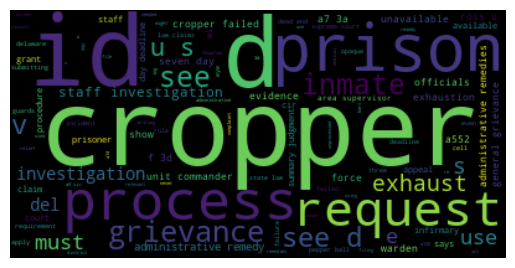

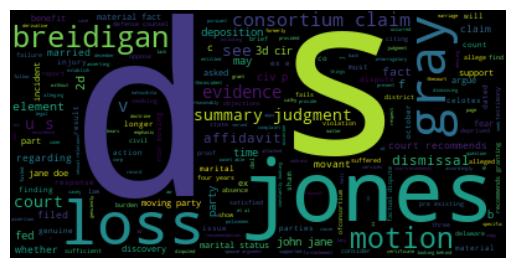

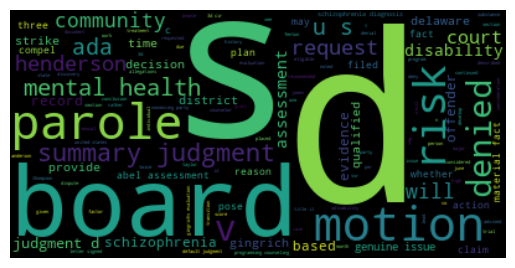

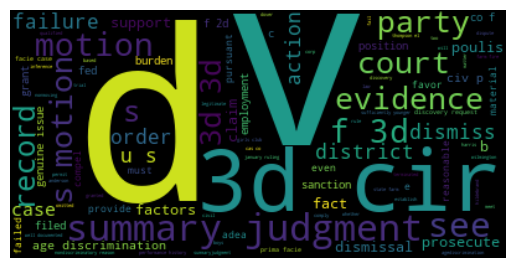

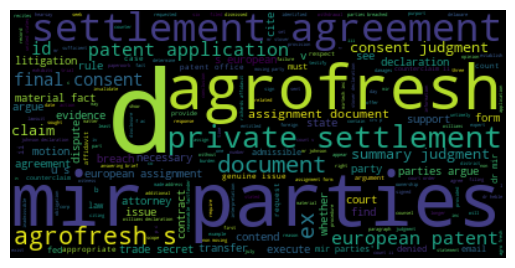



--------- Cluster 1 ---------


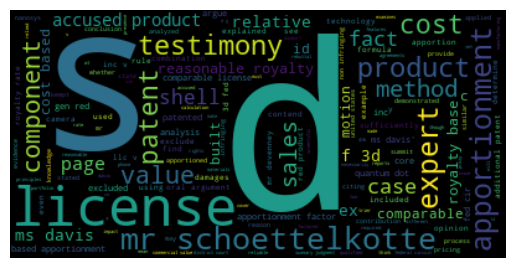

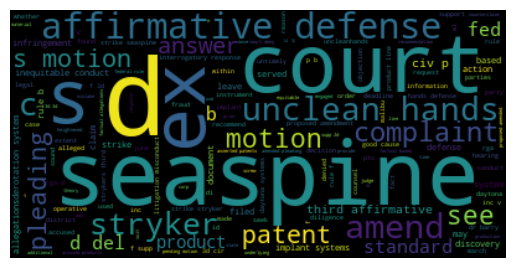

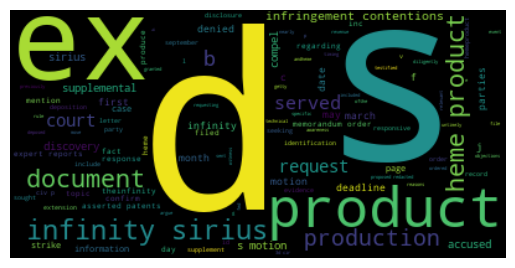

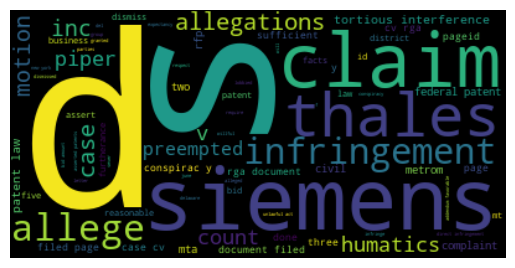

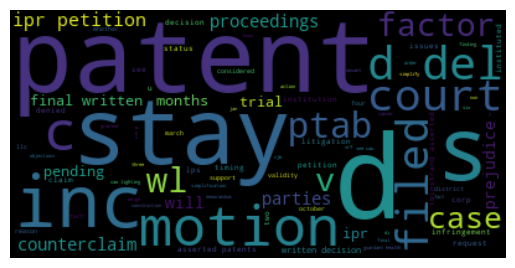



--------- Cluster 2 ---------


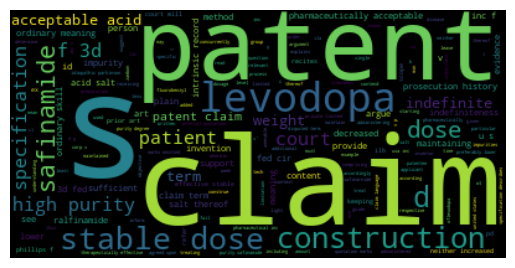

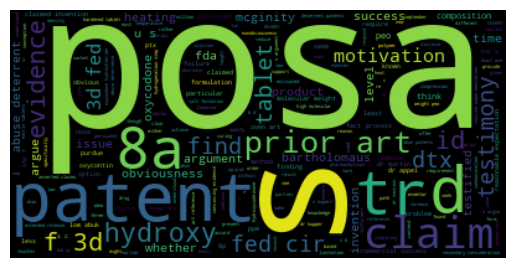

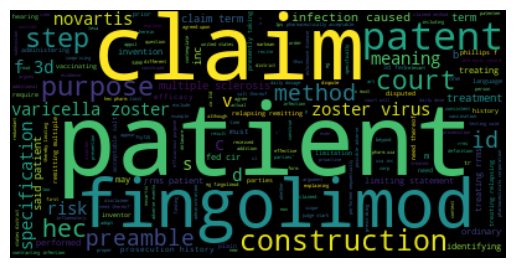

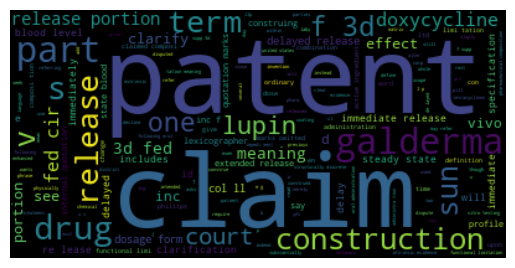

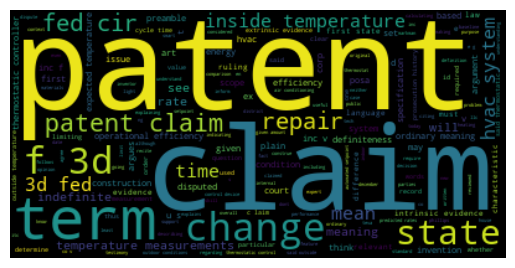



--------- Cluster 3 ---------


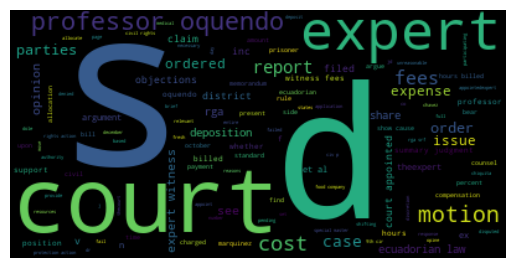

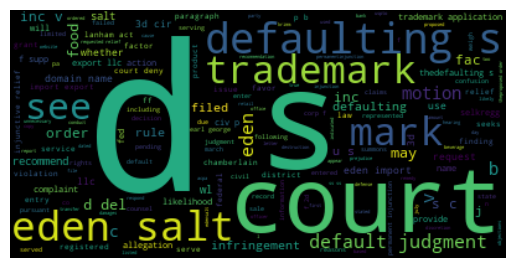

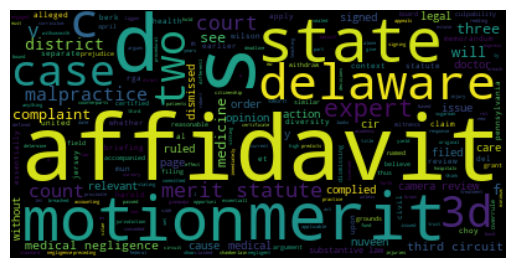

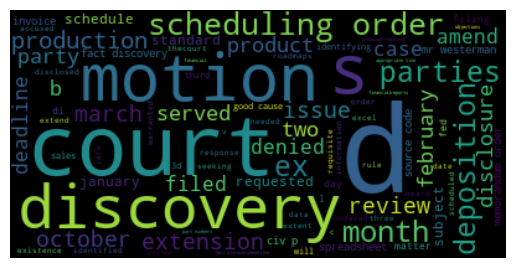

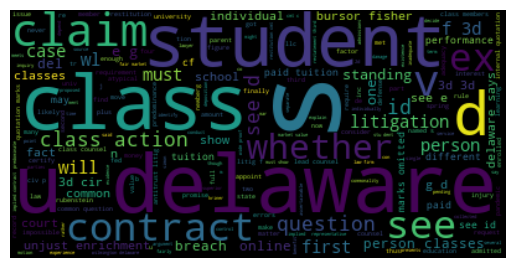



--------- Cluster 4 ---------


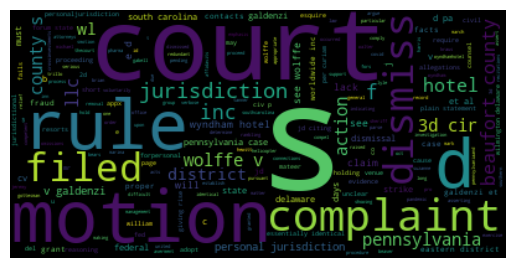

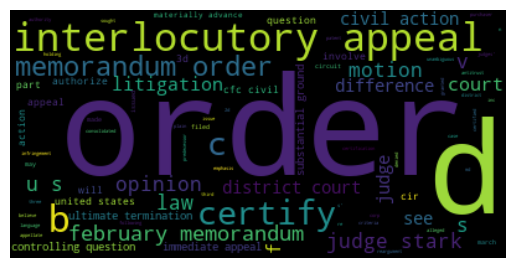

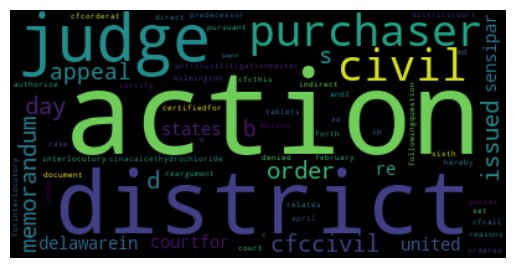

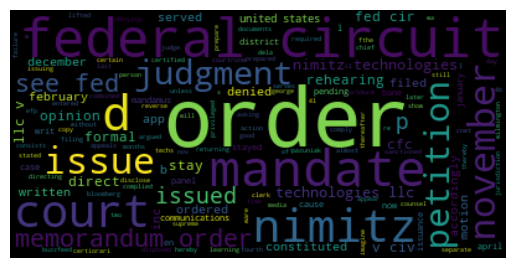

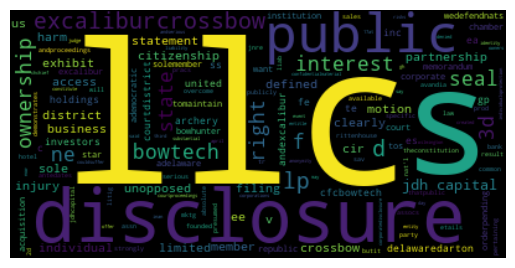



--------- Cluster 5 ---------


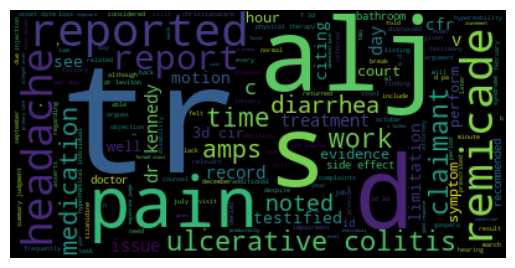

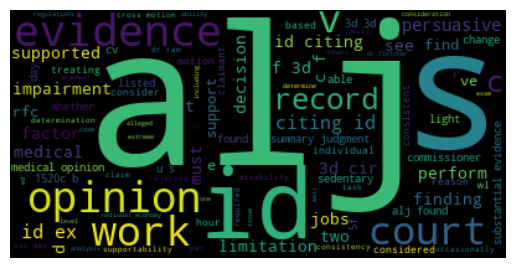

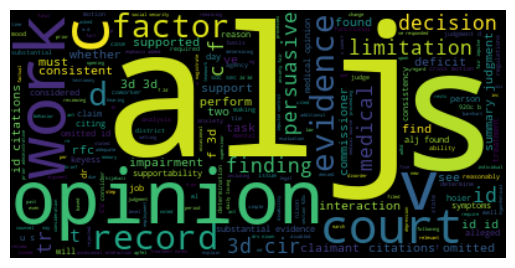

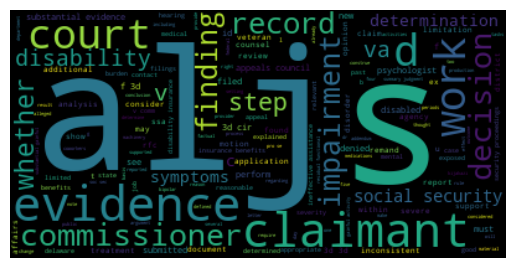

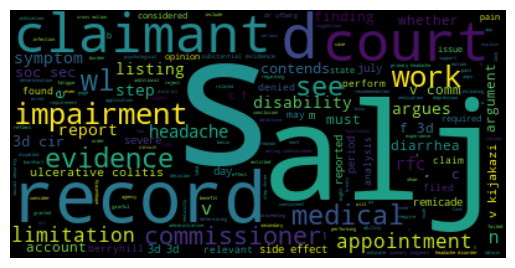



--------- Cluster 6 ---------


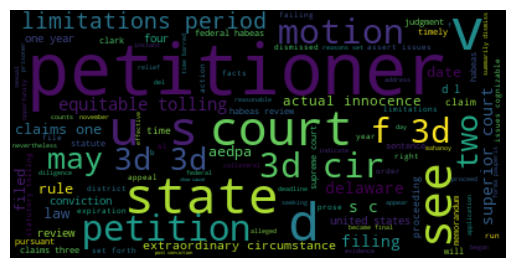

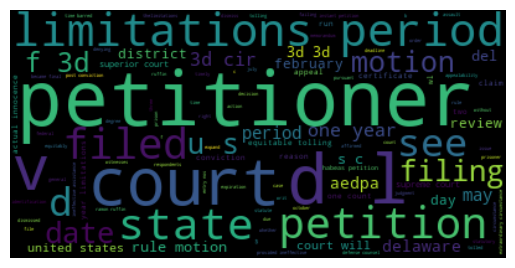

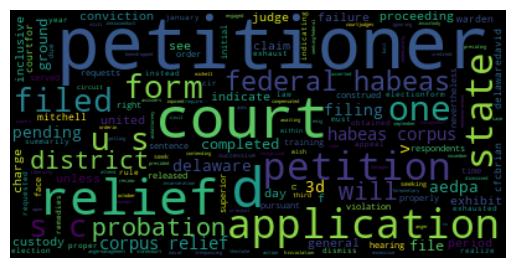

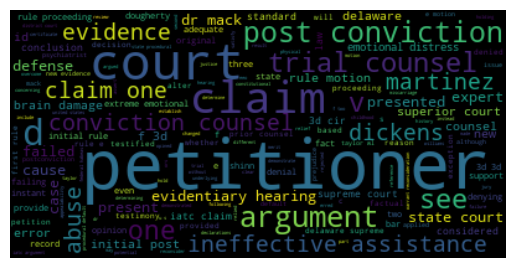

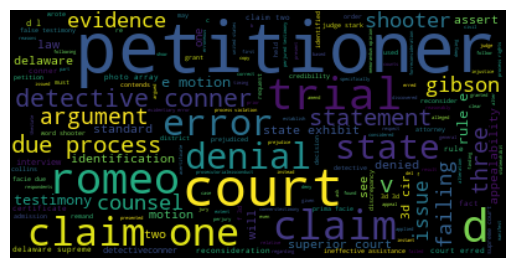



--------- Cluster 7 ---------


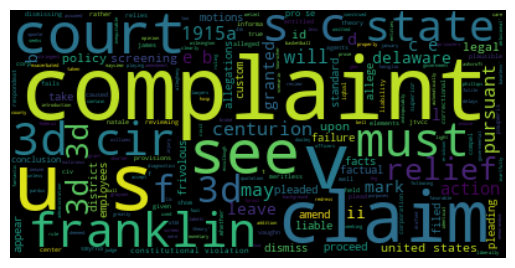

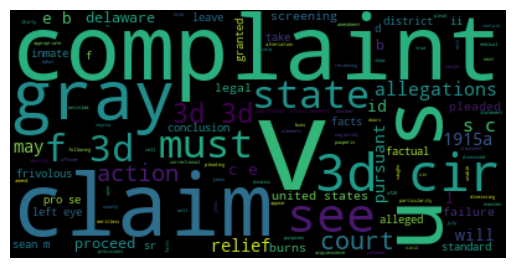

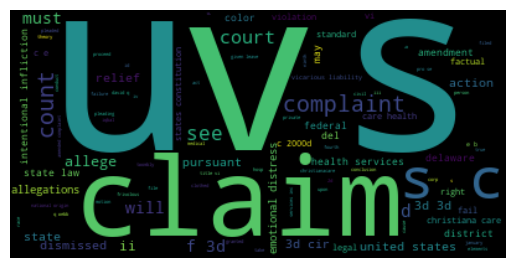

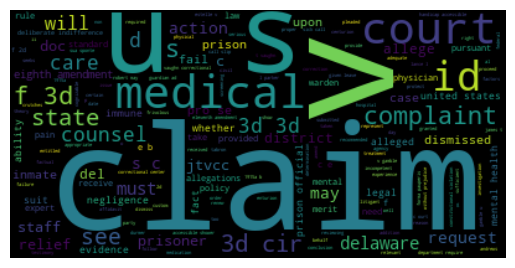

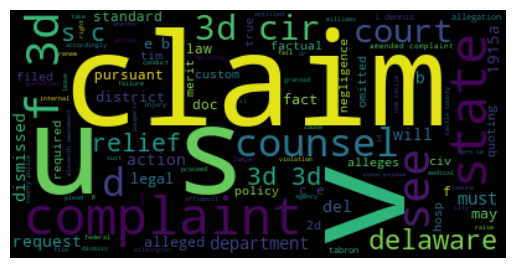



--------- Cluster 8 ---------


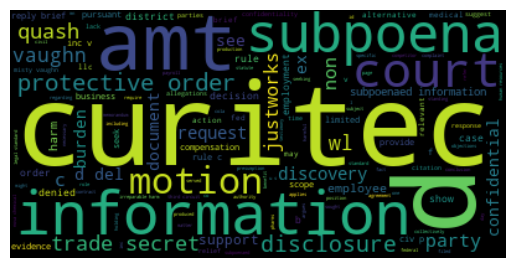

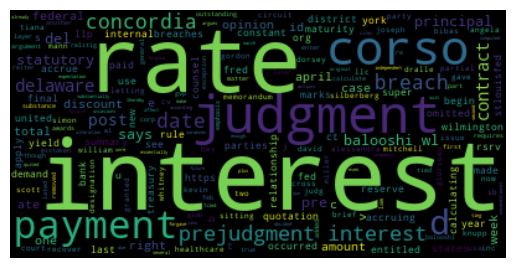

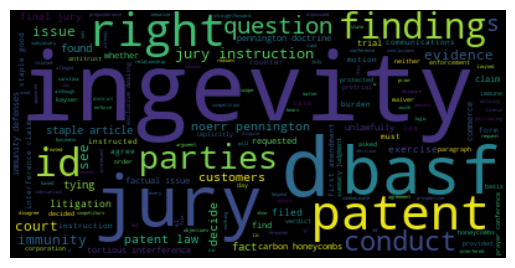

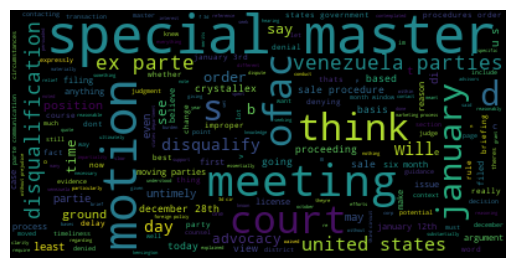

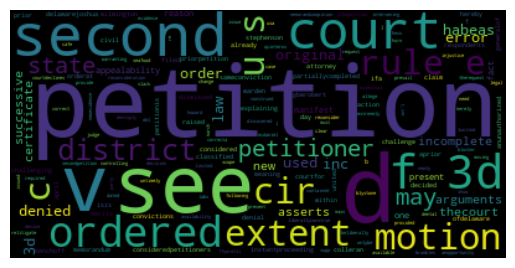



--------- Cluster 9 ---------


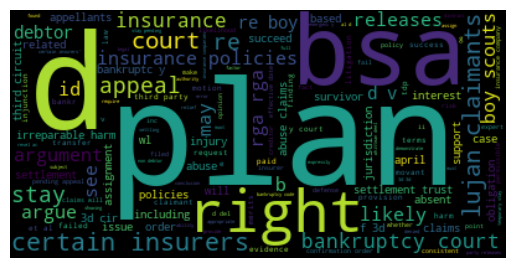

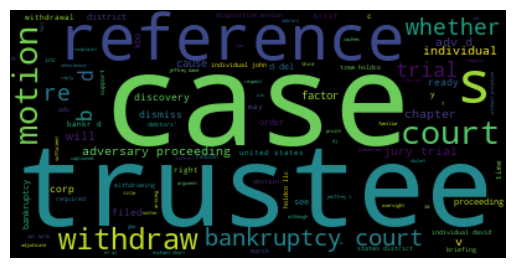

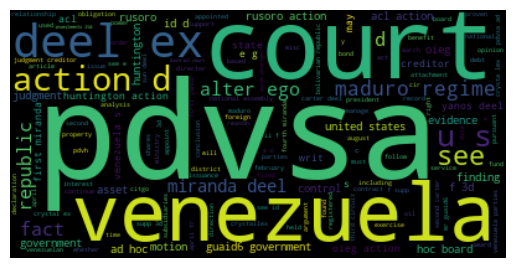

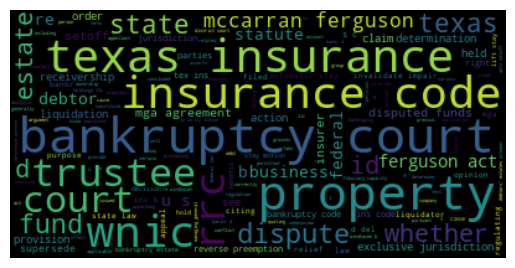

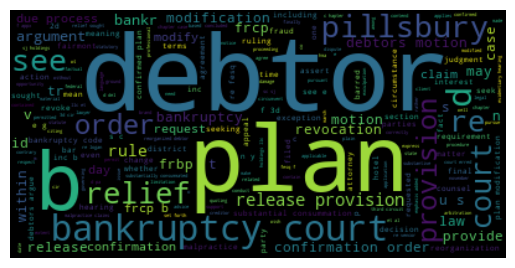

In [8]:
# Display Clusters
for i in range(n_clusters):
    print(f"--------- Cluster {i} ---------")
    i_df = df[df['tfidf_cluster'] == i]
    i_opinions = i_df['clean_text'][:5]
    for o in i_opinions:
        # Create a wordcloud object
        wordcloud = WordCloud().generate(o.replace('plaintiff', '').replace('defendant', ''))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
    print('\n')

In [9]:
# Plot Clusters
px.scatter(df, 'tfidf_umap_v1', 'tfidf_umap_v2' , color='tfidf_cluster')

## BERT Clustering

/Users/danielbejarano/opt/miniconda3/envs/arbilex_case/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



--------- Cluster 0 ---------


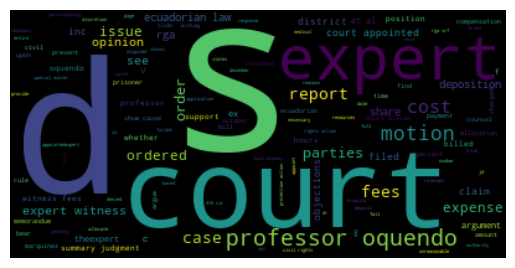

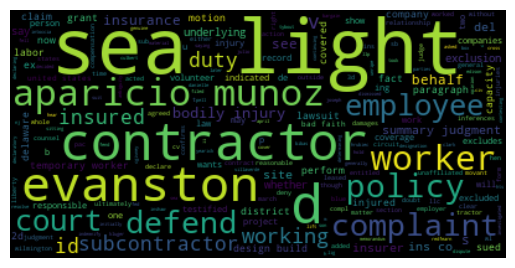

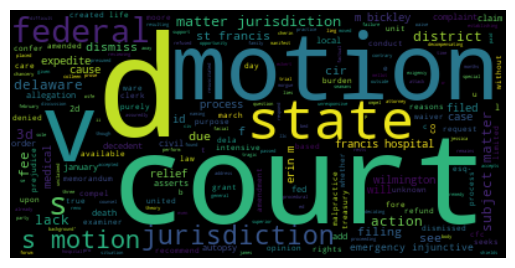

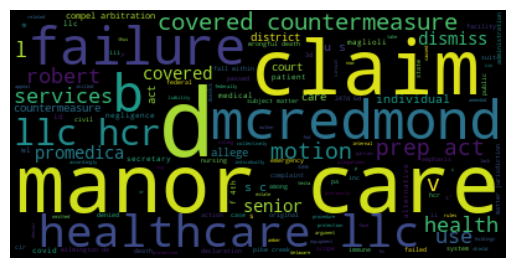

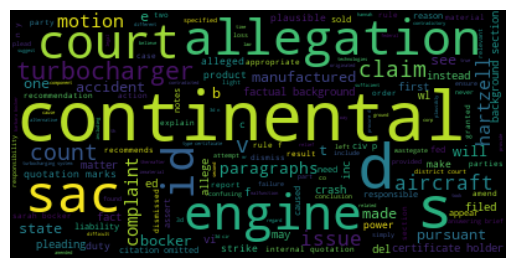



--------- Cluster 1 ---------


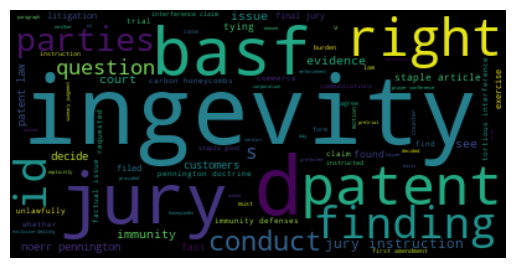

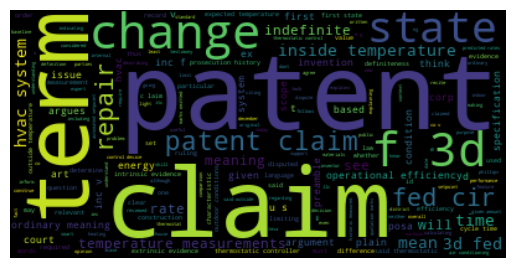

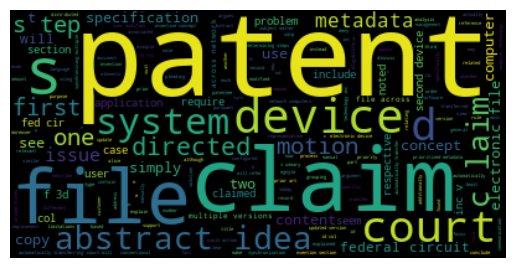

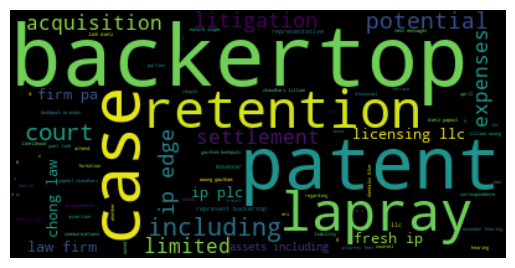

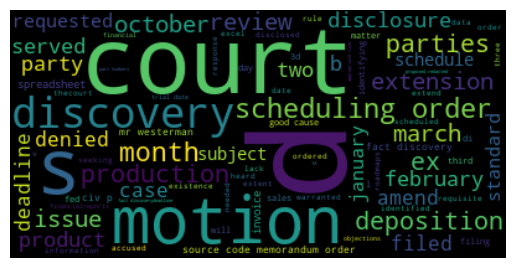



--------- Cluster 2 ---------


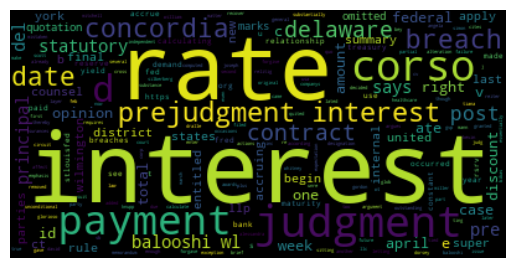

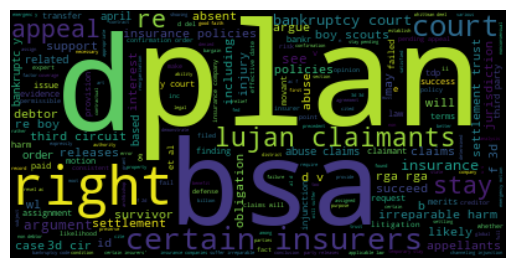

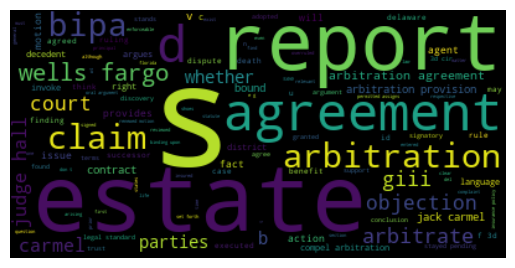

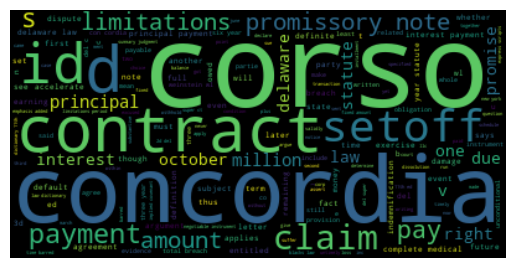

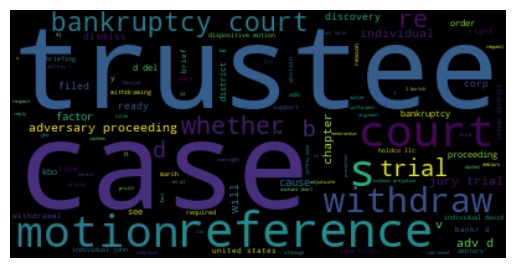



--------- Cluster 3 ---------


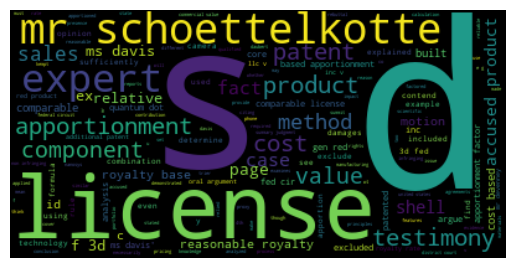

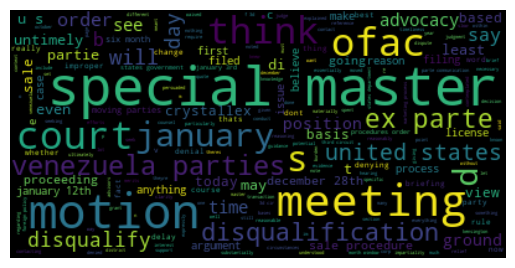

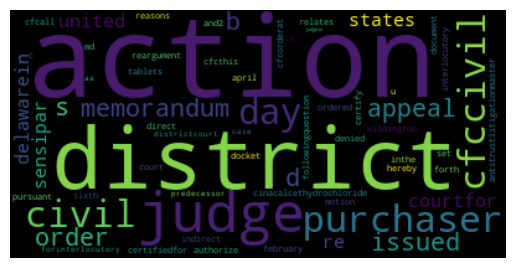

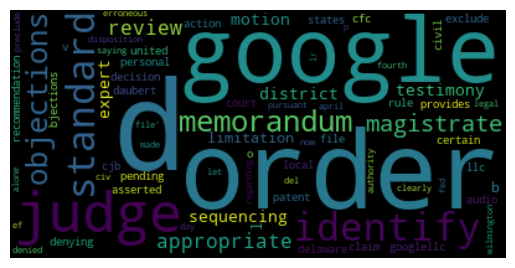

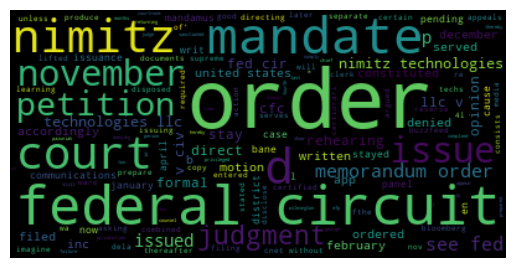



--------- Cluster 4 ---------


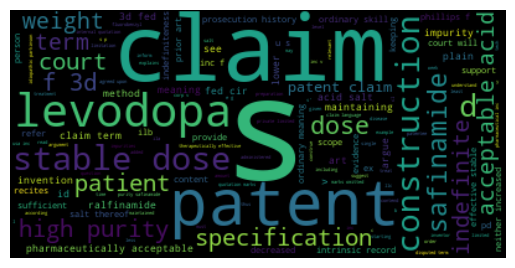

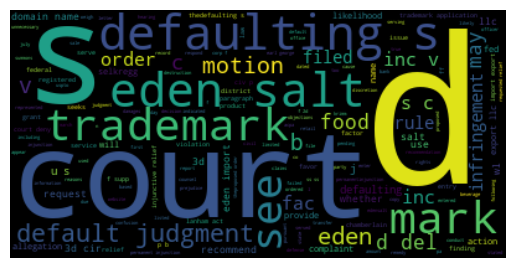

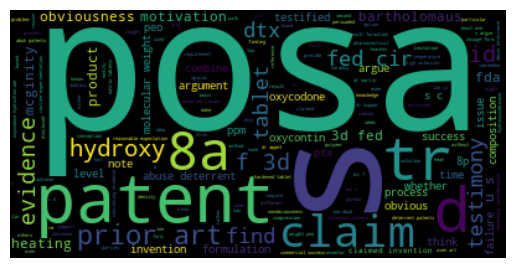

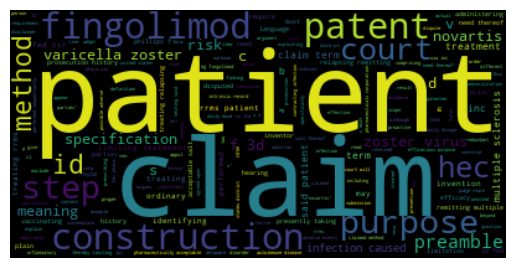

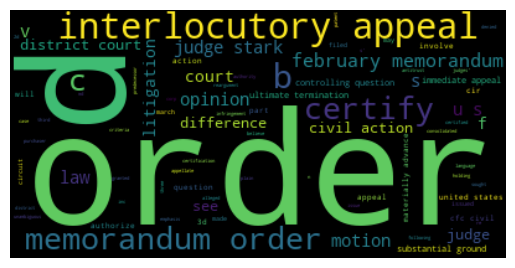



--------- Cluster 5 ---------


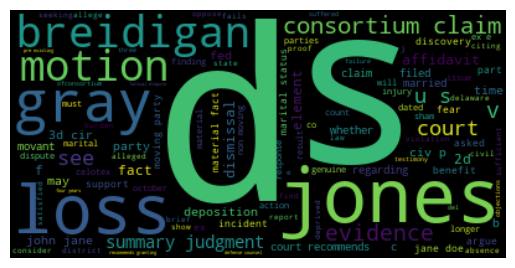

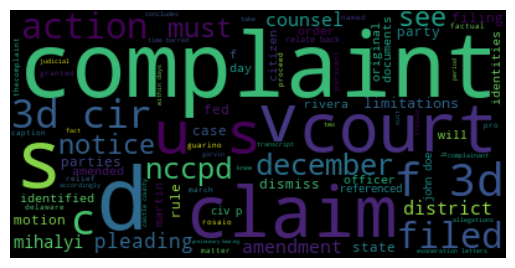

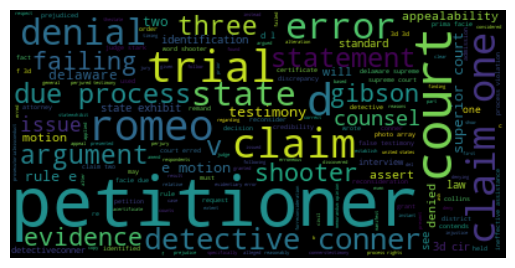

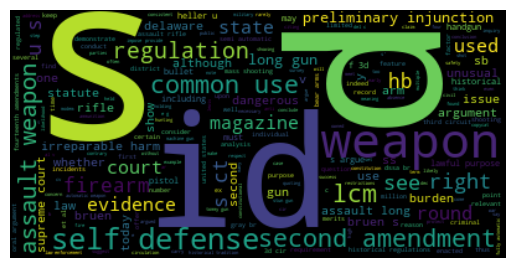

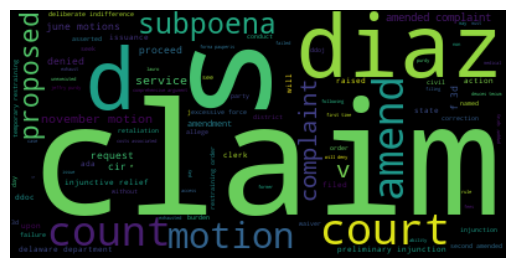



--------- Cluster 6 ---------


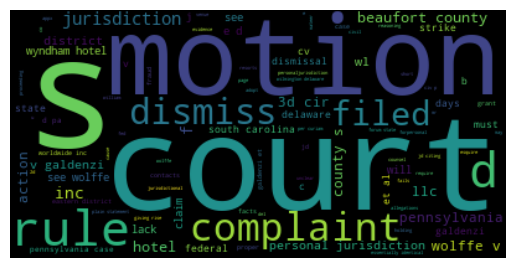

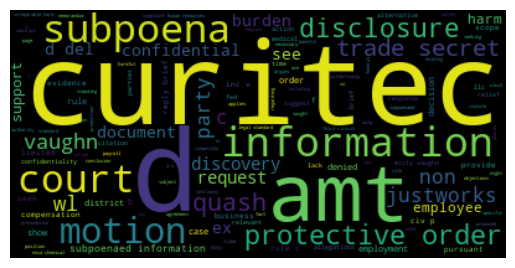

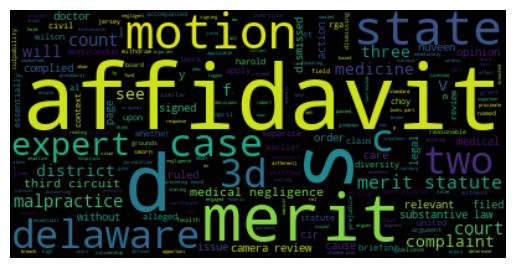

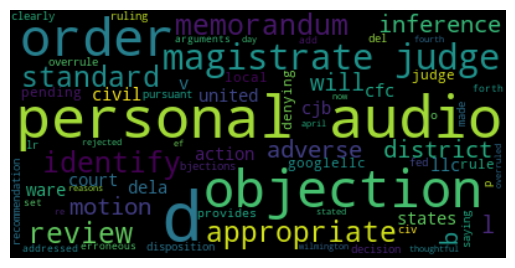

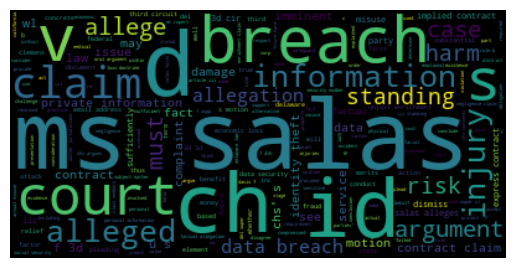



--------- Cluster 7 ---------


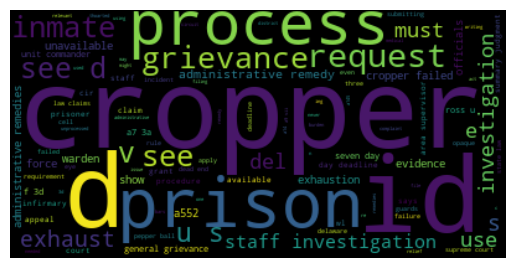

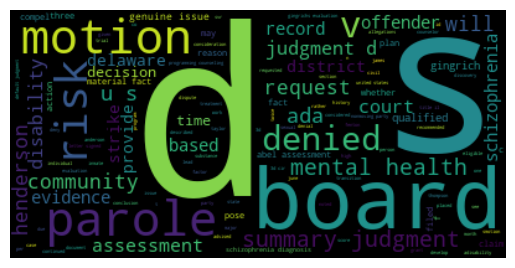

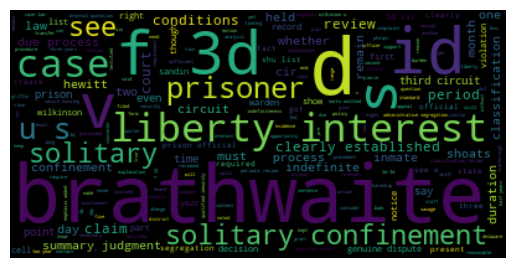

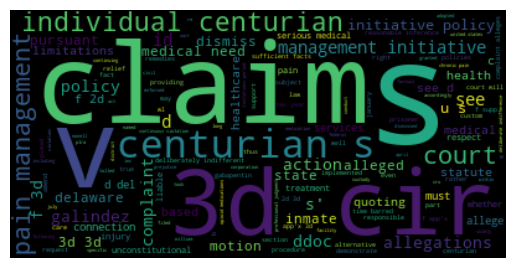

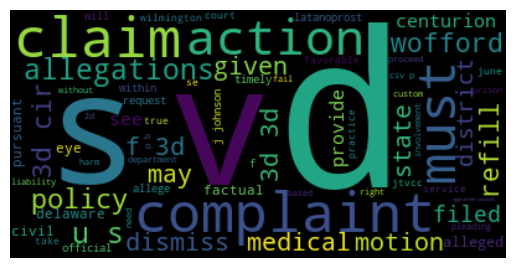



--------- Cluster 8 ---------


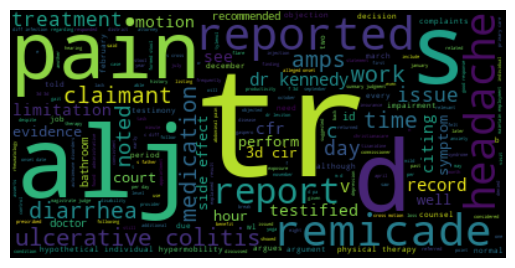

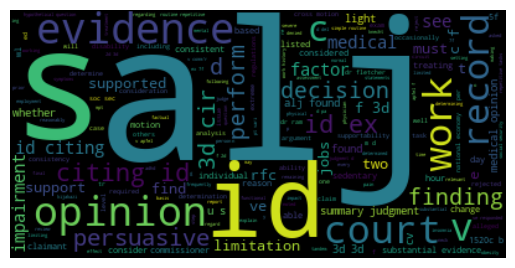

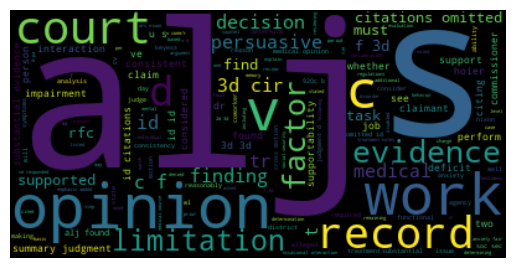

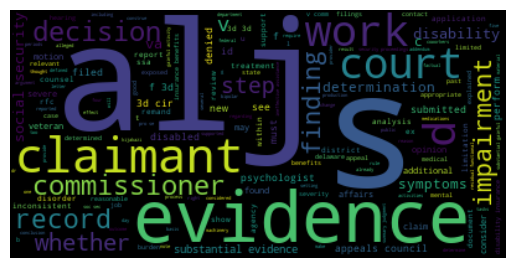

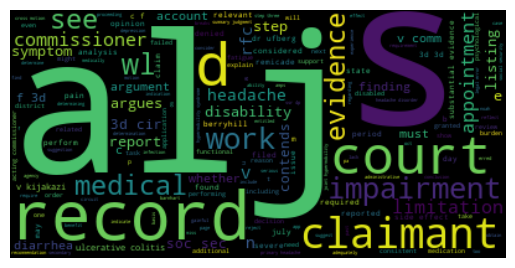



--------- Cluster 9 ---------


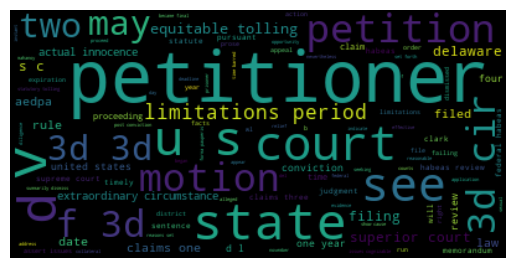

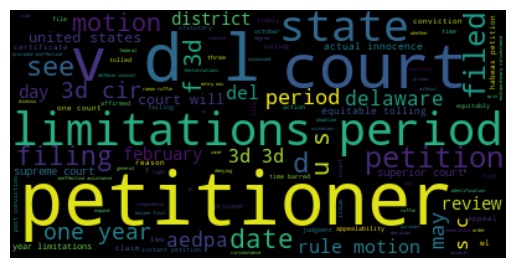

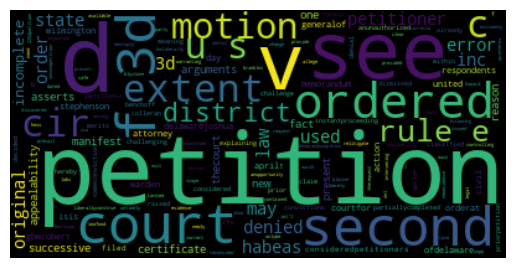

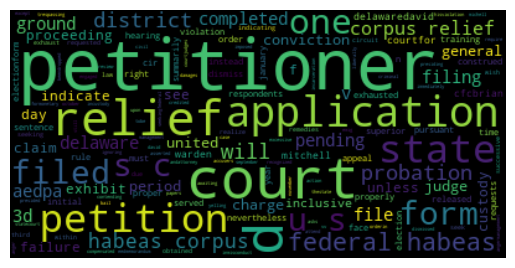

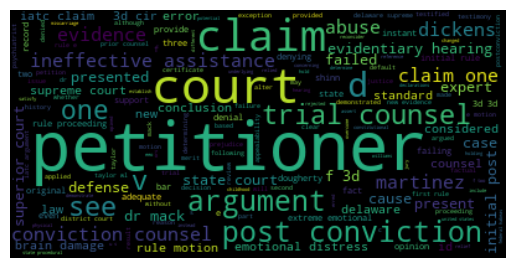

In [10]:
# Produce BERT Embeddings

# bert_model = SentenceTransformer('all-MiniLM-L6-v2')  # Performs a little worse than mpnet but it is 5X faster
bert_model = SentenceTransformer('all-mpnet-base-v2') 
bert_embeddings = bert_model.encode(df['clean_text'].values).tolist()

# Get optimal n
"""
*** NOTE ***
The code below is commented because it's computationally expensive. Instead I just choose a value for n_clusters
"""
# clusters_range = [4, 6, 8, 10, 12]
# n_clusters = determine_n_clusters_from_silhouette(embeddings, clusters_range) 
n_clusters = 10

# Fit to best performing 
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(bert_embeddings)

# Add clusters
df['bert_cluster'] = kmeans.labels_

# Run UMAP to reduce the dimensionality of the data to 2
reducer = umap.UMAP(n_neighbors=10, n_components=2, random_state=42)
vectors_for_plot = reducer.fit_transform(bert_embeddings)

df['bert_umap_v1'] = plot_df['X']
df['bert_umap_v2'] = plot_df['Y']

# Display Clusters
for i in range(n_clusters):
    print(f"--------- Cluster {i} ---------")
    i_df = df[df['bert_cluster'] == i]
    i_opinions = i_df['clean_text'][:5]
    for o in i_opinions:
        # Create a wordcloud object
        wordcloud = WordCloud().generate(o.replace('plaintiff', '').replace('defendant', ''))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
    print('\n')
    


In [11]:
# Plot Clusters
px.scatter(df, 'bert_umap_v1', 'bert_umap_v2' , color='bert_cluster')

In [12]:
# Save dataframe
df.to_csv('output_files/final_df.csv')

# Load Full Results
df = pd.read_csv('output_files/final_df.csv')


# Writeup

## Assumptions
1. I opted to crawl the site pages by changing the page number (e.g. 'page=3') in the URL. Alternatively, I could've used Scrapy to crawl the pages iteratively. However, in the interest of time, and considering scrapy is sometimes more easily flagged by sites as a crawler, I chose the former option.
2. In the Beautiful Soup code used, I'm relying on consistent and clean html structure. This could break, so in practice I would add guardrails that attempt other ways of retrieving data from html if one approach fails.
3. For the purposes of this exercise I chose the number of clusters for both TF-IDF and BERT to be the same number. In reality I would run a series of k-cluster options to find the optimal k. This value would likely be different for the two different vector spaces (TF-IDF vs BERT). I chose 10 clusters for the sake of time. In reality, it's ideal to run a range of clusters and evaluate their results (e.g. using silhouette score) and select the optimal number of clusters.
4. For the TF-IDF clustering analysis I chose to do N-grams with range 1-2. It would've been better to do a wider range (1-4 for instance) but my computer was having issues clustering on higher dimensional vectors. Three ways to solve that: (1) higher computer power, (2) using a GPU, and/or (3) applying dimensionality reduction prior to clustering (via PCA, TSNE or even UMAP).
5. When obtaining N-grams I did it after lemmatizing. This is the ideal approach, but what I didn't get to do was to map lemmatized words back to their original word (which can be done via a dictionary). That way we avoid the top-10 bigram results beings things like "United State", which of course should be "United States".


## Questions & Analysis
1. <b>What are the top 10 most frequent N-grams by N-gram length?</b>
    - [Please refer to results shown in section 3.3]
    

2. <b>Do the different clusters seem to correspond to different types of document?</b>
    - Assumptions:
        - Although there are better ways to graph these clusters in order to see documents similarities, I opted for a wordcloud approach for its simplicity.
        - I removed words like "plaintiff" and "defendant" from the wordclouds, because their frequency in most documents added noise. With more time, I would've first looked at those words distributions across documents to determine if indeed it was appropriate to remove them here or if they added valuable information. Also, although TF-IDF should take this into consideration, it's probably best to remove terms like "united state district" since it appears in most if not all documents. 
    - Analysis:
        -  There are noticeable patterns within clusters. Cluster #2, for instance, has to do with PATENTS. Cluster #6 focuses on PETITIONER. Cluster #9 contains documents dealing with bankruptcy and debt. 
        - From the UMAP cluster plots, we can notice that we some of the data could be clustered better. This indicates that either there are better choices of k-clusters, and/or we should test different UMAP hyperparameters.
    
    

3. <b>How do BERT clusters compare to the TD-IDF approach?</b>
    - Exciting enough, there are some similarities. BERT embeddings also contain a cluster with documents about PATENTS, and another one that is focused around PETITIONER. Then cluster #8 contains documents where an Administrative Law Judge (ALJ) presided over the case, which matches a TF-IDF cluster too. The patterns for BERT-based clusters aren't as obvious. This is likely a combination of (1) a deeper analysis of the actual clusters and their documents is necessary, and (2) the BERT embeddings I used are optimized for sentences, and here I applied them to entire documents. More on that in the following section...
    - From the UMAP clusters plot, we an also tell that our selection of k-clusters isn't optimal. There is probably higher variance of topics in the data that could be better captured with a higher k value. 
    


## Further Analyses:
To improve the results of the clustering analyses, I would try the following:
1. Compare results from clustering on the full dimension (as I did) with those from clustering on reduced vectors. In the past I have gotten good results by, say, reducing a 768 BERT embedding to 100 dimensions, then clustering. This can also be coupled with other approaches. For instance, one can sometimes get very separable clusters by reducing the vector dimensions and then appending to it some other vectors. These can be co-occurrence vectors, where you score documents based on the frequency at which pairs of words overlap, or it can be TF-IDF or Count scores for words in documents.
2. Here, clustering was done on TF-IDF and BERT embeddings for documents taken as a whole. Another approach can be to make them more granular to the paragraph or sentence level. Then either combining them to get average vectors for a whole document, or clustering at the sentence level and then getting clusters "averages" across documents. There are many possible approaches, and sometimes the best way to test performance is to try empirically.
3. One can't ignore the GPTs of the world these days. One thing I like to do is to use BERT for clustering, then process text from document using OpenAI's API to summarize what each cluster is about.
4. Because I ran out of time, my analyses in answering questions 1 and 2 above relied mainly on observations to the wordcloud visualizations. This is a good start, but far from comprehensive. There are many other ways to compare clusters and their similarities. From ways to measuring how spread or dense a cluster is, to the distance (eucledian or cosine) between clusters, to looking at the distribution of words and n-grams, and their overlap between clusters. Depending on the final use case, it is also sometimes a good idea to label subsets of the data, and using that to approximately evaluate performance of clustering methods. One has to be very cautious here though because it's easy to fall into overfitting traps.
5. An important observation is that both TF-IDF and BERT clusters did not truly separate by topics, but more so by terms. In the case of TF-IDF it's mainly because the n-gram range was 1-2 terms, which tends to favor 1-grams. As mentioned above, it would've been best to do a range that included 3- and 4-grams, but my computer didn't cooperate.
6. One analysis that could be helpful here is to limit the focus to Named Entities. By isolating key entities (like organizations, people, places) one can then find topics and sentiments around those entities. This is not only helpful for clustering purposes, but can also help stitch the story contained in the opinions.
7. Lastly, I would've loved to uncover patterns on the types of cases that get favorable or unfavorable opinions, for which actors, and by which judges. Basically answering questions like: "Does judge Jane Smith have a bias or predisposition for particular types of cases or actors?". Then, which is of course very tied to Arbilex's focus, be able to identify what are the characteristics of cases that get what types of opinions. These characteristics can range from the statistical structure of text, to the topics themselves, sentiments, or even patterns across time.